In [1]:
import scanpy as sc
import anndata as ann
import scipy as sci
import pandas as pd
import os
import numpy as np
import episcanpy.api as epi

/home/97212545/anaconda3/envs/scanpy/lib/python3.7/site-packages/scanpy/api/__init__.py:7: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning,


In [2]:
%config InlineBackend.figure_format='retina'

# scRNA-seq

In [3]:
SCRNA_DIR = '../data/granja-2019/scRNA/'

In [4]:
%%time
scrna = sc.read_10x_mtx(SCRNA_DIR, var_names='gene_symbols', cache=True)

var = pd.read_csv(SCRNA_DIR + 'var.csv')
var.index = var.gene_name
scrna.var = var

obs = pd.read_csv(SCRNA_DIR + 'obs.csv')
obs.index = obs.iloc[:,0]
scrna.obs = obs

CPU times: user 3.23 s, sys: 764 ms, total: 3.99 s
Wall time: 9.22 s


In [5]:
scrna

AnnData object with n_obs × n_vars = 53638 × 20287
    obs: 'Unnamed: 0', 'Group', 'nUMI_pre', 'nUMI', 'nGene', 'ProjectUMAP1', 'ProjectUMAP2', 'ProjectClassification', 'Barcode'
    var: 'gene_name', 'gene_id', 'exonLength'

In [6]:
scrna.obs.head()

,Unnamed: 0,Group,nUMI_pre,nUMI,nGene,ProjectUMAP1,ProjectUMAP2,ProjectClassification,Barcode
Unnamed: 0,,,,,,,,,
RM2:AAACCTGAGTGTCCCG-1,RM2:AAACCTGAGTGTCCCG-1,MPAL5R_T1,1802,1441,896,-6.581877,3.819128,Progenitor_Like,AAACCTGAGTGTCCCG-1
RM2:AAAGATGGTCCGAGTC-1,RM2:AAAGATGGTCCGAGTC-1,MPAL5R_T1,12368,7988,3029,-6.184691,2.277092,Myeloid_Like,AAAGATGGTCCGAGTC-1
RM2:AAATGCCCAAATTGCC-1,RM2:AAATGCCCAAATTGCC-1,MPAL5R_T1,1945,1036,600,-5.550443,2.505810,Myeloid_Like,AAATGCCCAAATTGCC-1
RM2:AAATGCCTCGTTACAG-1,RM2:AAATGCCTCGTTACAG-1,MPAL5R_T1,2529,1551,957,-5.936206,2.888241,Progenitor_Like,AAATGCCTCGTTACAG-1
RM2:AACACGTAGGAGCGAG-1,RM2:AACACGTAGGAGCGAG-1,MPAL5R_T1,5864,3774,1592,-6.512098,-0.113418,Myeloid_Like,AACACGTAGGAGCGAG-1


In [7]:
scrna.var.head()

,gene_name,gene_id,exonLength
gene_name,,,
FAM138A,FAM138A,ENSG00000237613,1219
OR4F5,OR4F5,ENSG00000186092,918
AL627309.1,AL627309.1,ENSG00000237683,2661
OR4F29,OR4F29,ENSG00000235249,995
OR4F16,OR4F16,ENSG00000185097,995


## Data Cleaning

In [8]:
scrna.obs.drop('Unnamed: 0', axis=1, inplace=True)

In [9]:
scrna.obs.rename(columns={'ProjectClassification': 'cell_type'}, inplace=True)

In [10]:
scrna.obsm['X_umap'] = scrna.obs[['ProjectUMAP1', 'ProjectUMAP2']].to_numpy()
scrna.obs.drop(['ProjectUMAP1', 'ProjectUMAP2'], axis=1, inplace=True)

In [11]:
scrna.obs['condition'] = scrna.obs['cell_type'].map(lambda a: 'stimulated' if a.endswith('Like') else 'control')

In [12]:
scrna.obs.head()

,Group,nUMI_pre,nUMI,nGene,cell_type,Barcode,condition
Unnamed: 0,,,,,,,
RM2:AAACCTGAGTGTCCCG-1,MPAL5R_T1,1802,1441,896,Progenitor_Like,AAACCTGAGTGTCCCG-1,stimulated
RM2:AAAGATGGTCCGAGTC-1,MPAL5R_T1,12368,7988,3029,Myeloid_Like,AAAGATGGTCCGAGTC-1,stimulated
RM2:AAATGCCCAAATTGCC-1,MPAL5R_T1,1945,1036,600,Myeloid_Like,AAATGCCCAAATTGCC-1,stimulated
RM2:AAATGCCTCGTTACAG-1,MPAL5R_T1,2529,1551,957,Progenitor_Like,AAATGCCTCGTTACAG-1,stimulated
RM2:AACACGTAGGAGCGAG-1,MPAL5R_T1,5864,3774,1592,Myeloid_Like,AACACGTAGGAGCGAG-1,stimulated


In [13]:
scrna.var = scrna.var.drop('gene_name', axis=1)
scrna.var.head()

,gene_id,exonLength
gene_name,,
FAM138A,ENSG00000237613,1219
OR4F5,ENSG00000186092,918
AL627309.1,ENSG00000237683,2661
OR4F29,ENSG00000235249,995
OR4F16,ENSG00000185097,995


We just store the raw data, before quality control and normalization:

In [14]:
%time scrna.write(SCRNA_DIR + 'expressions-raw.h5ad')

... storing 'Group' as categorical
... storing 'cell_type' as categorical
... storing 'Barcode' as categorical
... storing 'condition' as categorical


CPU times: user 1.14 s, sys: 864 ms, total: 2 s
Wall time: 5.91 s


## Quality Control

Data is already quality controlled by the authors. Here we just plot to show this fact.

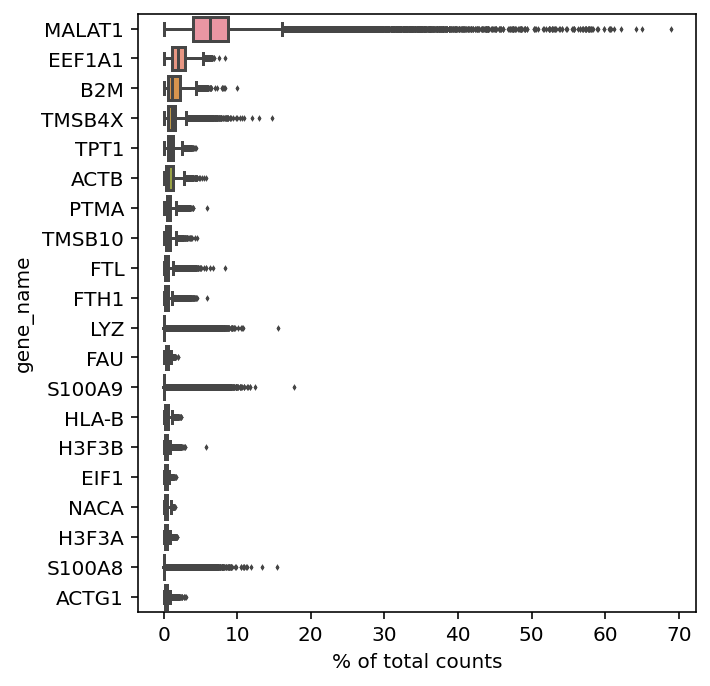

In [15]:
sc.pl.highest_expr_genes(scrna, n_top=20)

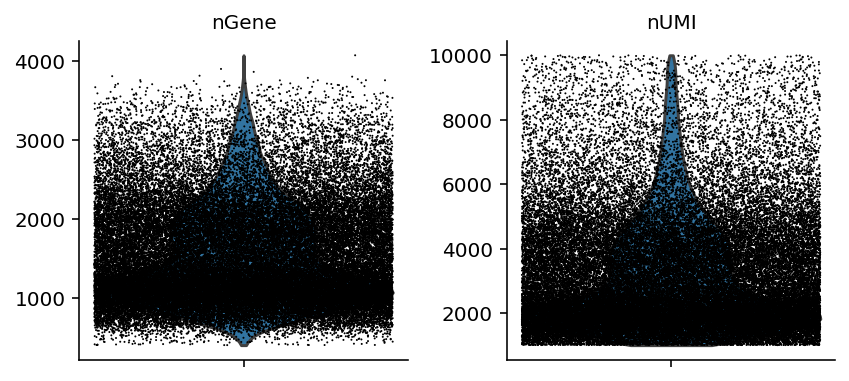

In [16]:
sc.pl.violin(scrna, ['nGene', 'nUMI'], jitter=0.4, multi_panel=True)

## Normalization

In [17]:
sc.pp.normalize_total(scrna, target_sum=1e4)
sc.pp.log1p(scrna)

In [18]:
scrna

AnnData object with n_obs × n_vars = 53638 × 20287
    obs: 'Group', 'nUMI_pre', 'nUMI', 'nGene', 'cell_type', 'Barcode', 'condition'
    var: 'gene_id', 'exonLength'
    uns: 'log1p'
    obsm: 'X_umap'

## Filtering Highly Variable Genes

In [19]:
sc.pp.highly_variable_genes(scrna, n_top_genes=3000)

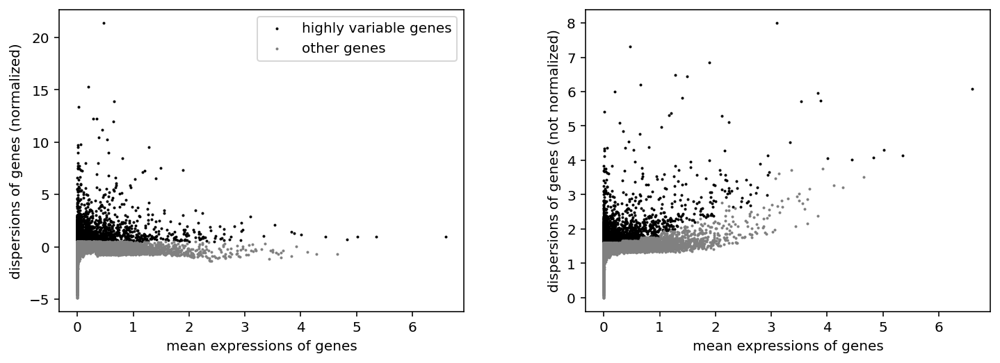

In [20]:
sc.pl.highly_variable_genes(scrna)

In [21]:
scrna = scrna[:, scrna.var.highly_variable]
scrna

View of AnnData object with n_obs × n_vars = 53638 × 2999
    obs: 'Group', 'nUMI_pre', 'nUMI', 'nGene', 'cell_type', 'Barcode', 'condition'
    var: 'gene_id', 'exonLength', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p'
    obsm: 'X_umap'

## Visualization

### UMAP using coordinates provided by the authors

Trying to set attribute `.uns` of view, copying.


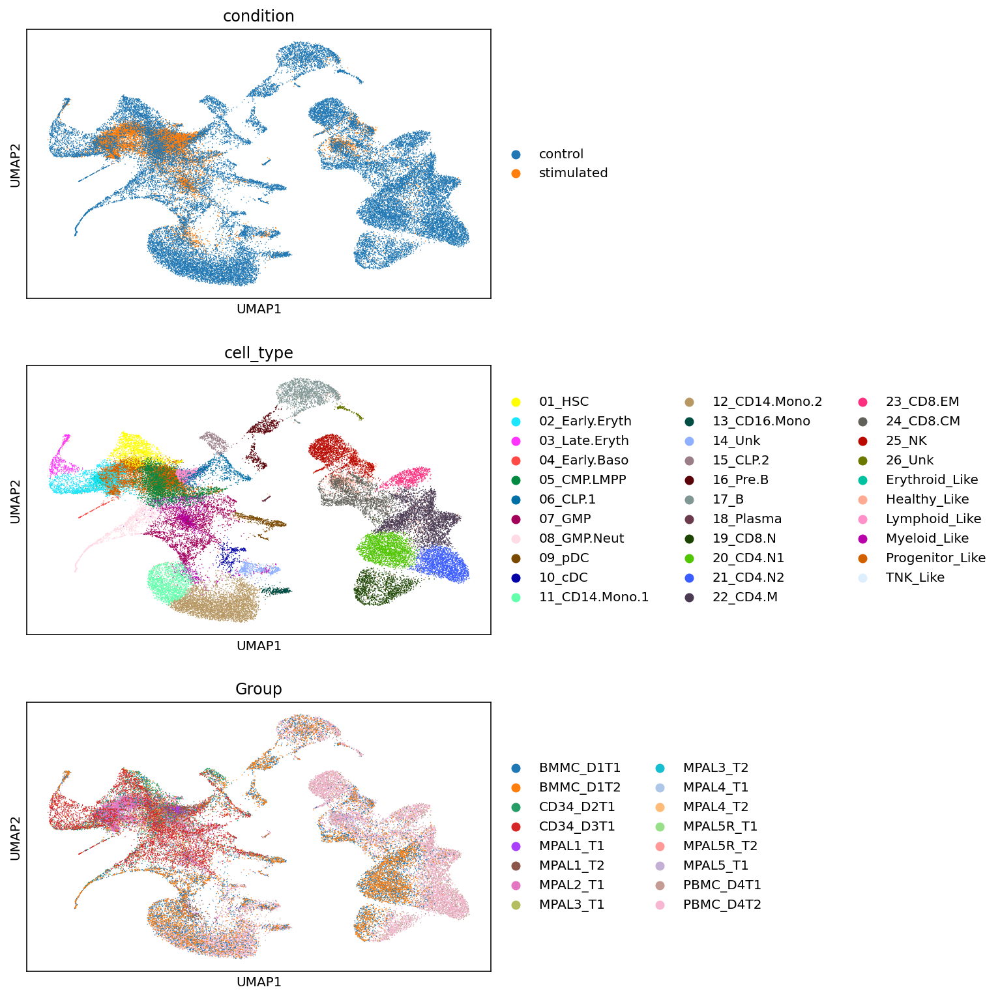

In [22]:
sc.pl.umap(scrna, color=['condition', 'cell_type', 'Group'], ncols=1)

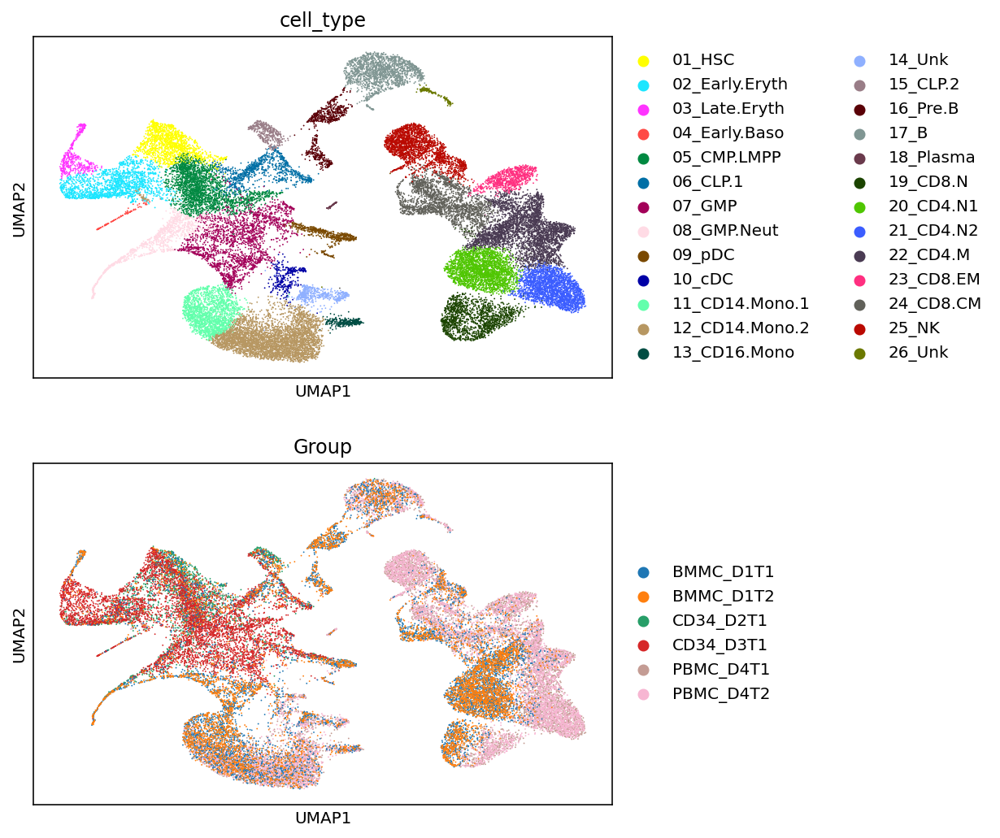

In [23]:
sc.pl.umap(scrna[scrna.obs['condition'] == 'control'], color=['cell_type', 'Group'], ncols=1)

Trying to set attribute `.uns` of view, copying.


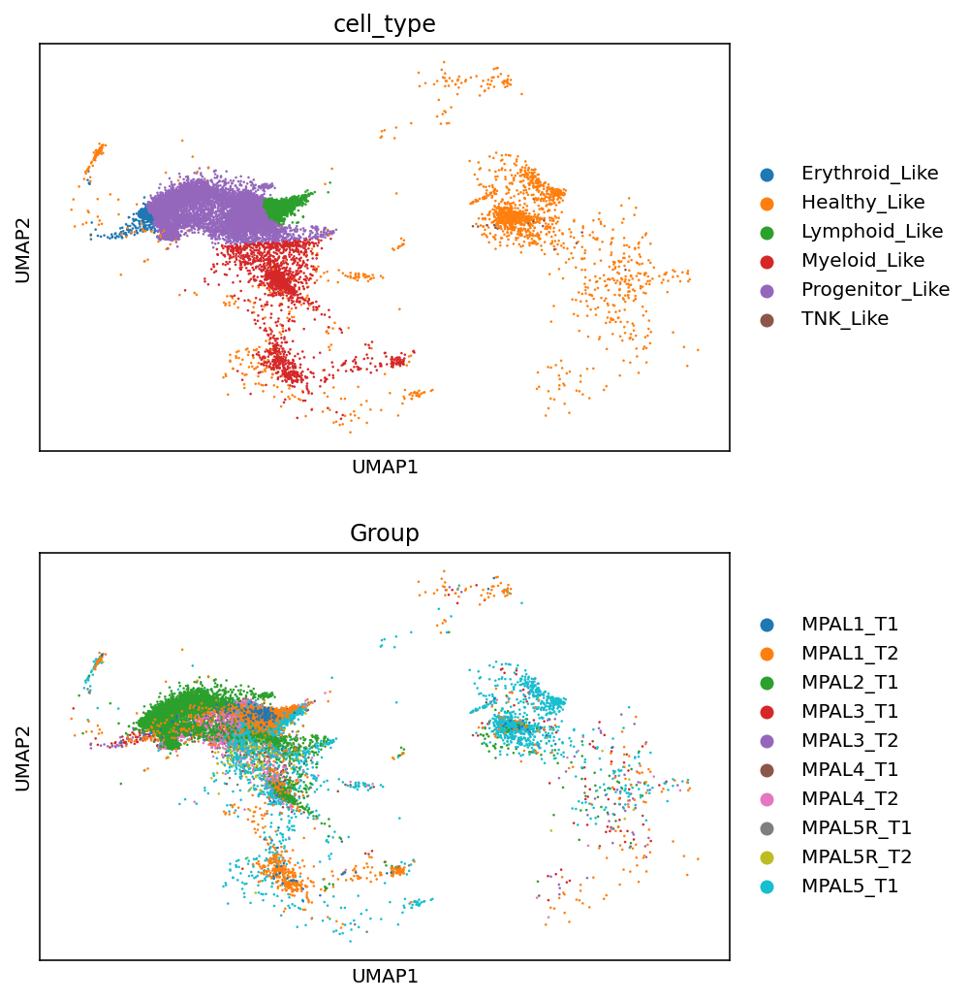

In [24]:
sc.pl.umap(scrna[scrna.obs['condition'] == 'stimulated'], color=['cell_type', 'Group'], ncols=1)

### Running UMAP

In [25]:
sc.pp.neighbors(scrna, random_state=42)
sc.tl.umap(scrna, random_state=42)

         Falling back to preprocessing with `sc.pp.pca` and default params.


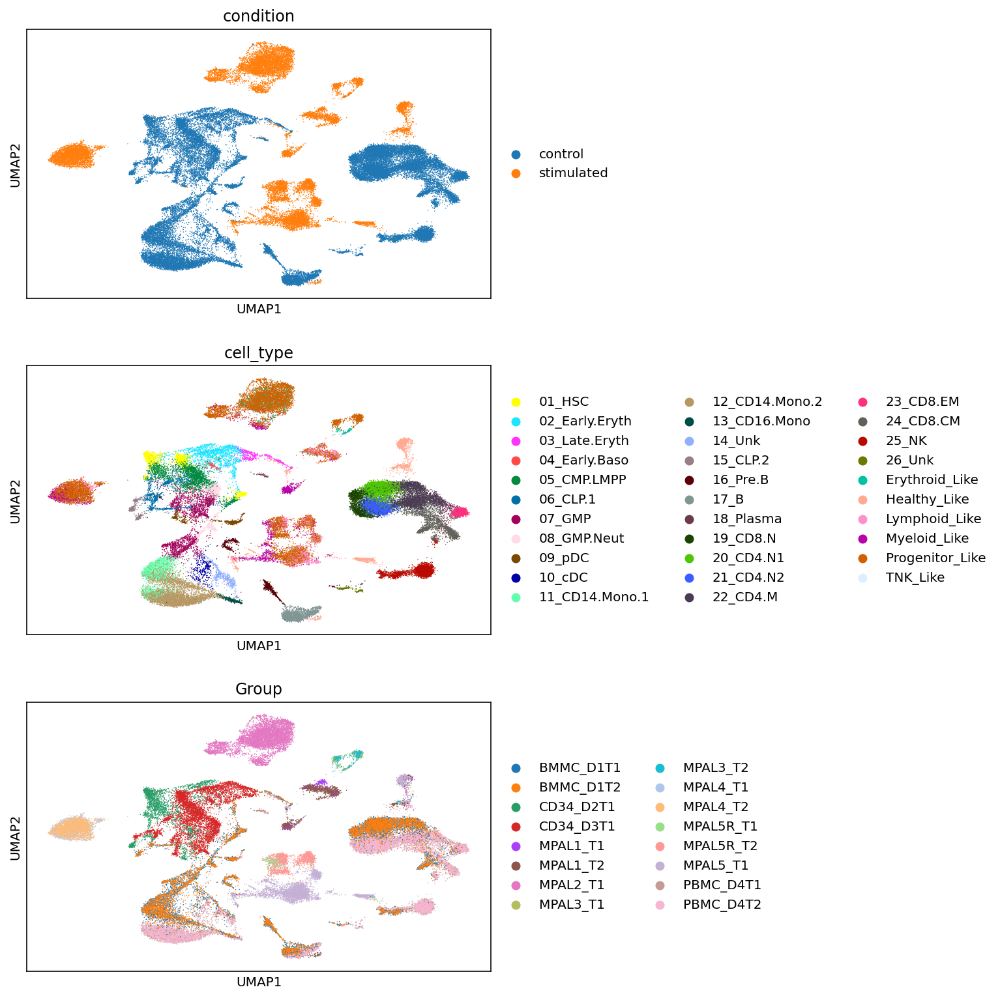

In [26]:
sc.pl.umap(scrna, color=['condition', 'cell_type', 'Group'], ncols=1)

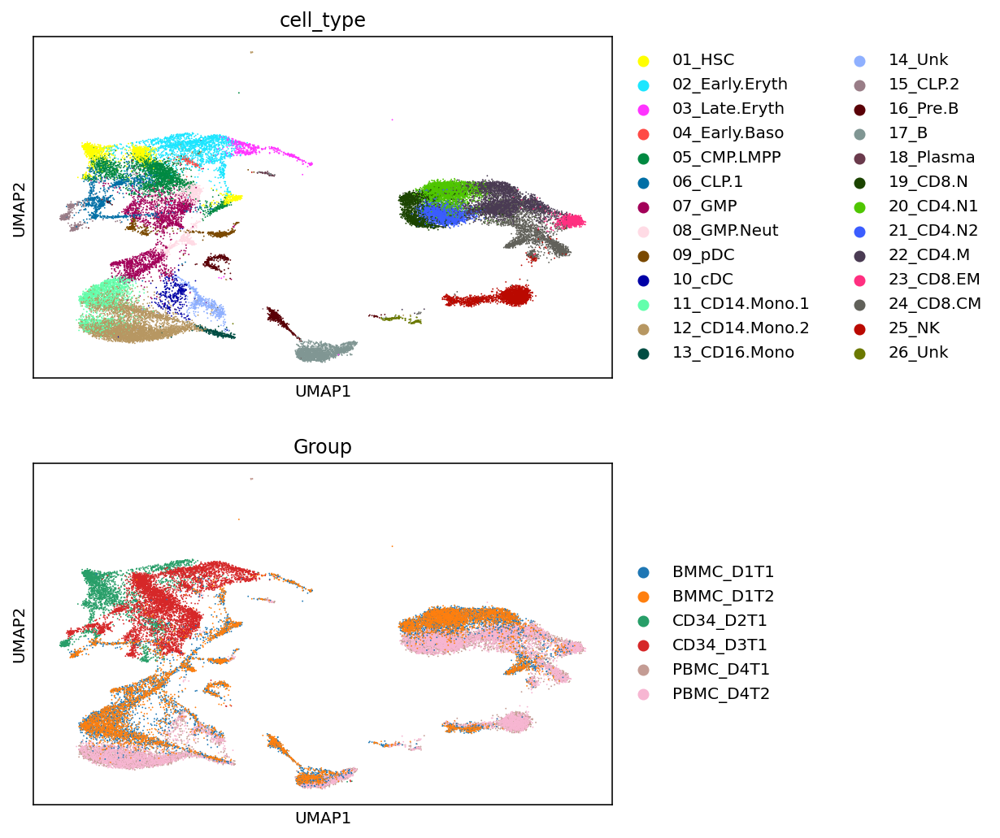

In [27]:
sc.pl.umap(scrna[scrna.obs['condition'] == 'control'], color=['cell_type', 'Group'], ncols=1)

Trying to set attribute `.uns` of view, copying.


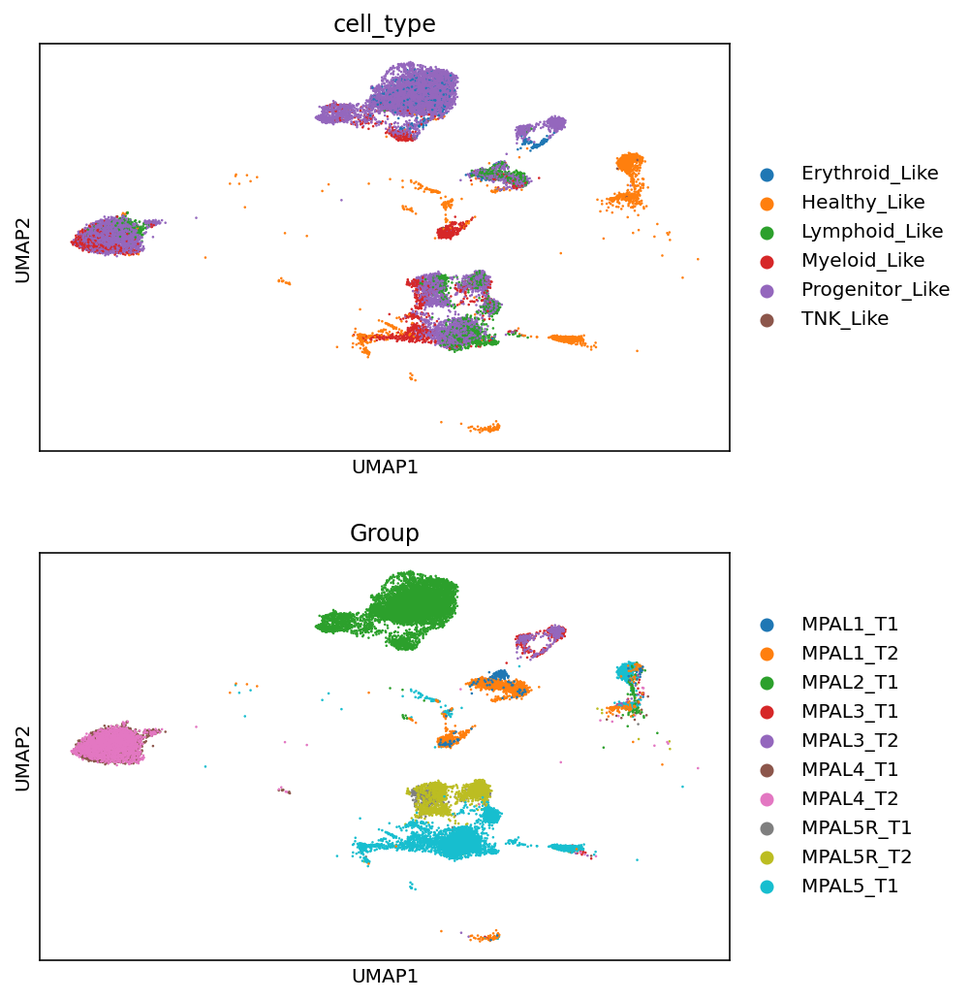

In [28]:
sc.pl.umap(scrna[scrna.obs['condition'] == 'stimulated'], color=['cell_type', 'Group'], ncols=1)

# scATAC-seq

In [29]:
SCATAC_DIR = '../data/granja-2019/scATAC/peaks/'

In [30]:
%%time
scatac = sc.read_10x_mtx(SCATAC_DIR, var_names='gene_symbols', cache=True)

var = pd.read_csv(SCATAC_DIR + 'var.csv')
scatac.var = var

obs = pd.read_csv(SCATAC_DIR + 'obs.csv')
scatac.obs = obs

CPU times: user 1min 16s, sys: 22.7 s, total: 1min 38s
Wall time: 2min 4s


In [31]:
scatac

AnnData object with n_obs × n_vars = 70461 × 506543
    obs: 'Unnamed: 0', 'FRIP', 'TotalReads', 'Group', 'Barcode', 'initialClusters', 'UMAP1', 'UMAP2', 'Clusters', 'ProjectUMAP1', 'ProjectUMAP2', 'ProjectClassification'
    var: 'Unnamed: 0', 'score', 'scoreQuantile', 'name', 'GC'

In [32]:
scatac.obs.head()

,Unnamed: 0,FRIP,TotalReads,Group,Barcode,initialClusters,UMAP1,UMAP2,Clusters,ProjectUMAP1,ProjectUMAP2,ProjectClassification
0,BMM_R1_19,0.556943,67260,BMMC_D5T1,TAGGAGGGTGCACTTA-1,Cluster1,9.028878,-3.070899,Cluster1,-7.257169,-3.767484,07_GMP
1,BMM_R1_21,0.541798,17154,BMMC_D5T1,CCTAAAGTCCGCCTAT-1,Cluster2,0.151454,13.363869,Cluster2,9.737446,-2.393460,22_CD4.M
2,BMM_R1_24,0.551778,38974,BMMC_D5T1,CCTAAAGAGAAATACC-1,Cluster3,-3.914717,-6.629660,Cluster3,1.359905,12.922869,02_Early.Eryth
3,BMM_R1_25,0.590287,38898,BMMC_D5T1,TAAACCGCACATTCTT-1,Cluster4,-2.434527,12.142631,Cluster4,11.522385,1.818643,24_CD8.CM
4,BMM_R1_26,0.626936,36546,BMMC_D5T1,TTGCCCACATTCGTCC-1,Cluster4,-1.765110,12.288043,Cluster4,10.663303,0.689267,24_CD8.CM


In [33]:
scatac.var.head()

,Unnamed: 0,score,scoreQuantile,name,GC
0,chr1_10262_10762,569.13025,0.730487,scATAC_1,0.668663
1,chr1_115474_115974,14.71841,0.404278,scATAC_2,0.397206
2,chr1_237503_238003,118.22647,0.688421,scATAC_3,0.461078
3,chr1_240798_241298,18.89871,0.391035,scATAC_4,0.477046
4,chr1_540713_541213,116.68542,0.611578,scATAC_6,0.502994


## Data Cleaning

In [34]:
scatac.obs.set_index('Unnamed: 0', inplace=True)

In [35]:
scatac.var.set_index('Unnamed: 0', inplace=True)

In [36]:
scatac.obs.rename(columns={'ProjectClassification': 'cell_type'}, inplace=True)

In [37]:
scatac.obsm['X_umap'] = scatac.obs[['ProjectUMAP1', 'ProjectUMAP2']].to_numpy()
scatac.obs.drop(['ProjectUMAP1', 'ProjectUMAP2'], axis=1, inplace=True)

In [38]:
scatac.obs['condition'] = scatac.obs['cell_type'].map(lambda a: 'stimulated' if a.endswith('Like') else 'control')

In [39]:
scatac.obs.head()

,FRIP,TotalReads,Group,Barcode,initialClusters,UMAP1,UMAP2,Clusters,cell_type,condition
Unnamed: 0,,,,,,,,,,
BMM_R1_19,0.556943,67260,BMMC_D5T1,TAGGAGGGTGCACTTA-1,Cluster1,9.028878,-3.070899,Cluster1,07_GMP,control
BMM_R1_21,0.541798,17154,BMMC_D5T1,CCTAAAGTCCGCCTAT-1,Cluster2,0.151454,13.363869,Cluster2,22_CD4.M,control
BMM_R1_24,0.551778,38974,BMMC_D5T1,CCTAAAGAGAAATACC-1,Cluster3,-3.914717,-6.629660,Cluster3,02_Early.Eryth,control
BMM_R1_25,0.590287,38898,BMMC_D5T1,TAAACCGCACATTCTT-1,Cluster4,-2.434527,12.142631,Cluster4,24_CD8.CM,control
BMM_R1_26,0.626936,36546,BMMC_D5T1,TTGCCCACATTCGTCC-1,Cluster4,-1.765110,12.288043,Cluster4,24_CD8.CM,control


In [40]:
scatac.var.head()

,score,scoreQuantile,name,GC
Unnamed: 0,,,,
chr1_10262_10762,569.13025,0.730487,scATAC_1,0.668663
chr1_115474_115974,14.71841,0.404278,scATAC_2,0.397206
chr1_237503_238003,118.22647,0.688421,scATAC_3,0.461078
chr1_240798_241298,18.89871,0.391035,scATAC_4,0.477046
chr1_540713_541213,116.68542,0.611578,scATAC_6,0.502994


Save the raw data:

In [41]:
%time scatac.write_h5ad(SCATAC_DIR + 'peaks-raw.h5ad')

... storing 'Group' as categorical
... storing 'Barcode' as categorical
... storing 'initialClusters' as categorical
... storing 'Clusters' as categorical
... storing 'cell_type' as categorical
... storing 'condition' as categorical


CPU times: user 9.76 s, sys: 6.02 s, total: 15.8 s
Wall time: 49.8 s


## Binarization

In [42]:
%time scatac = epi.pp.binarize(scatac, copy=True)
scatac

CPU times: user 1min, sys: 1min 8s, total: 2min 8s
Wall time: 3min 47s


AnnData object with n_obs × n_vars = 70461 × 506543
    obs: 'FRIP', 'TotalReads', 'Group', 'Barcode', 'initialClusters', 'UMAP1', 'UMAP2', 'Clusters', 'cell_type', 'condition'
    var: 'score', 'scoreQuantile', 'name', 'GC'
    obsm: 'X_umap'

## Selecting variable peaks

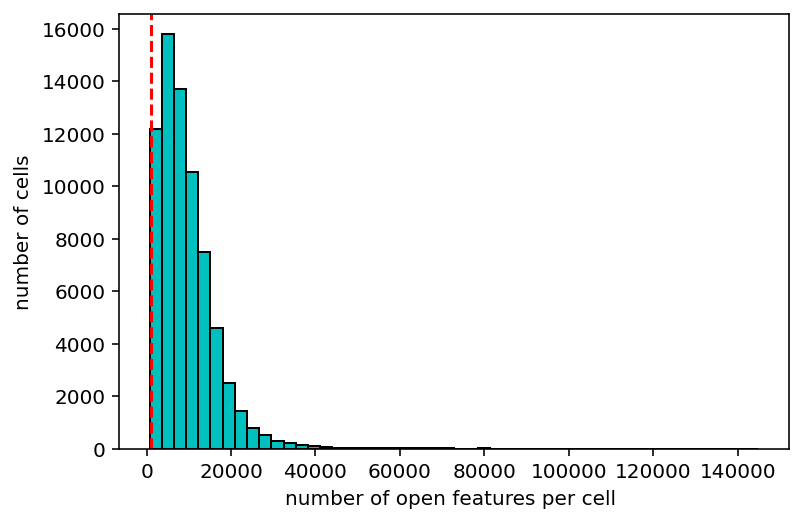

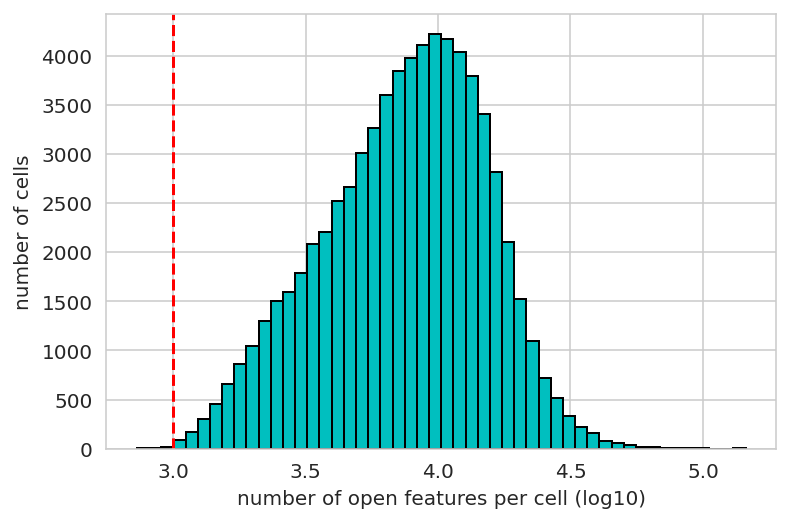

In [43]:
epi.pp.coverage_cells(scatac, binary=True, log=False, bins=50, threshold=1000)
epi.pp.coverage_cells(scatac, binary=True, log=10, bins=50, threshold=1000)

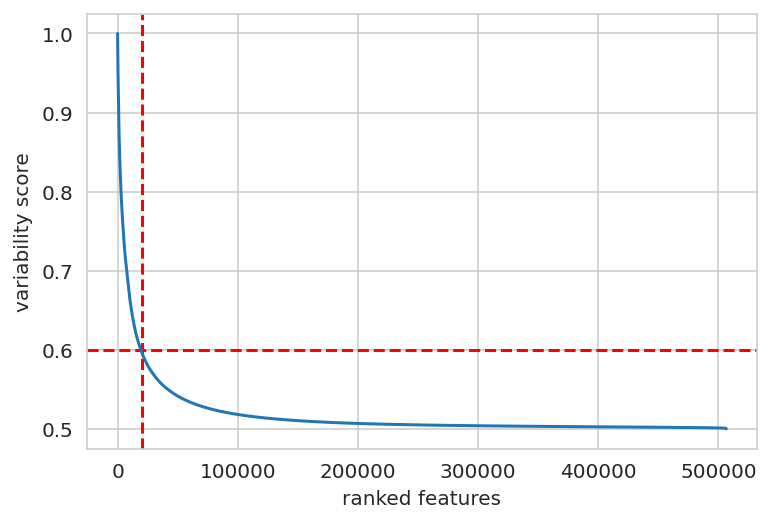

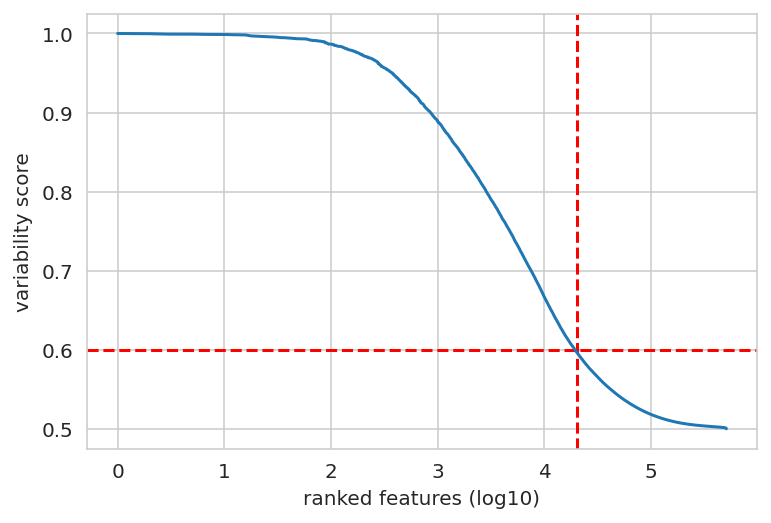

In [44]:
min_score_value = 0.6
nb_feature_selected = 20000
epi.pl.variability_features(scatac, log=None, min_score=min_score_value, nb_features=nb_feature_selected)
epi.pl.variability_features(scatac, log='log10', min_score=min_score_value, nb_features=nb_feature_selected)

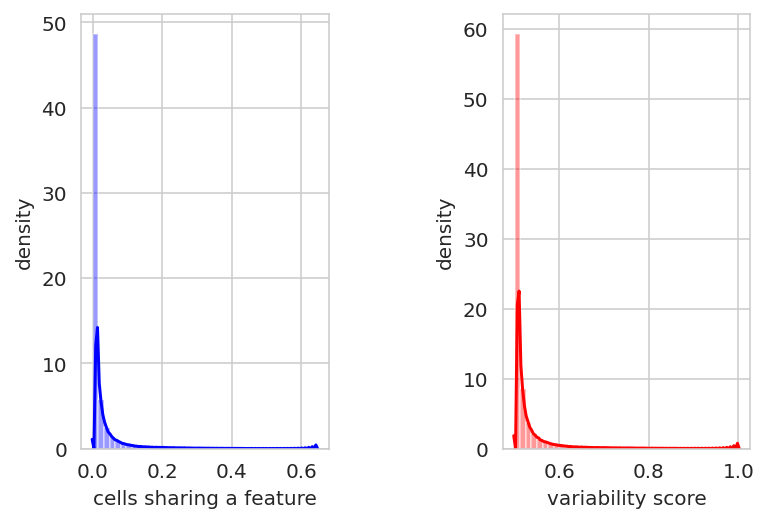

CPU times: user 12.1 s, sys: 20.1 s, total: 32.3 s
Wall time: 34.7 s


In [45]:
%time scatac = epi.pp.select_var_feature(scatac, nb_features=nb_feature_selected, copy=True)

## Visualization

### UMAP using coordinates provided by the authors

Trying to set attribute `.uns` of view, copying.


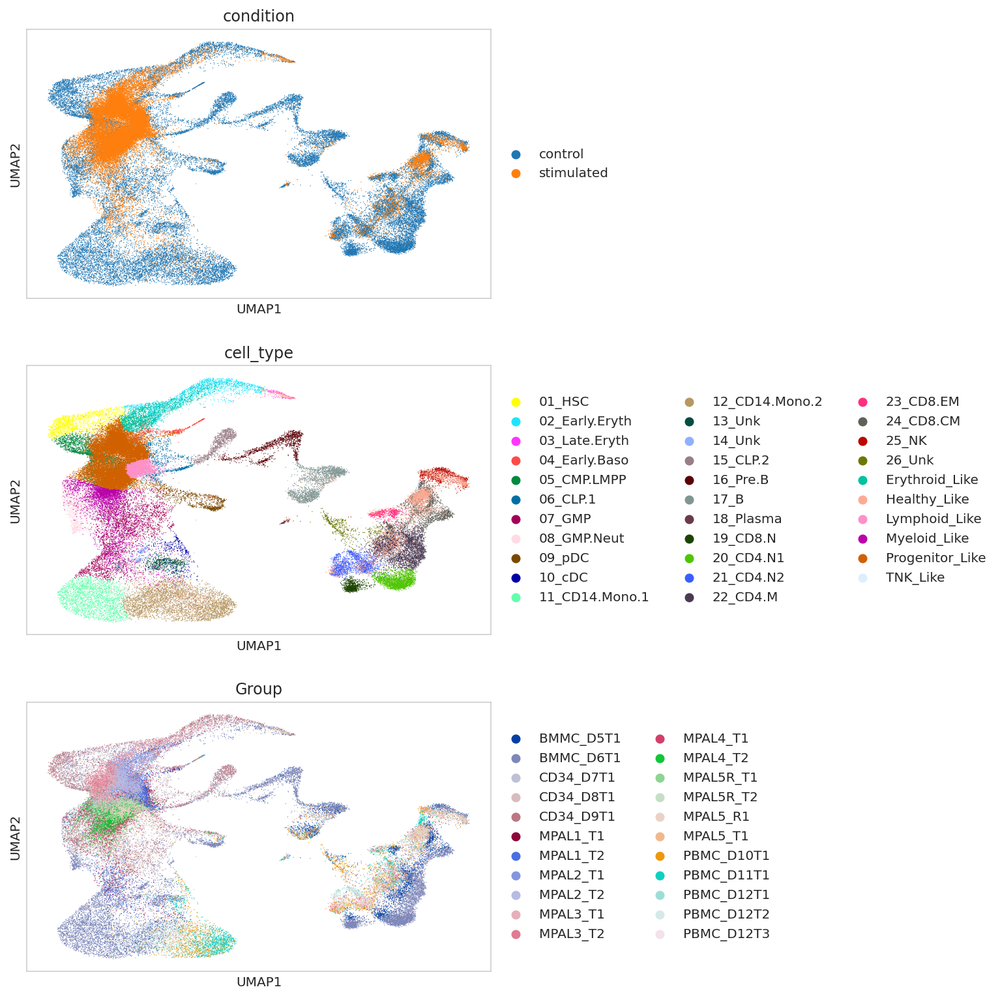

In [46]:
sc.pl.umap(scatac, color=['condition', 'cell_type', 'Group'], ncols=1)

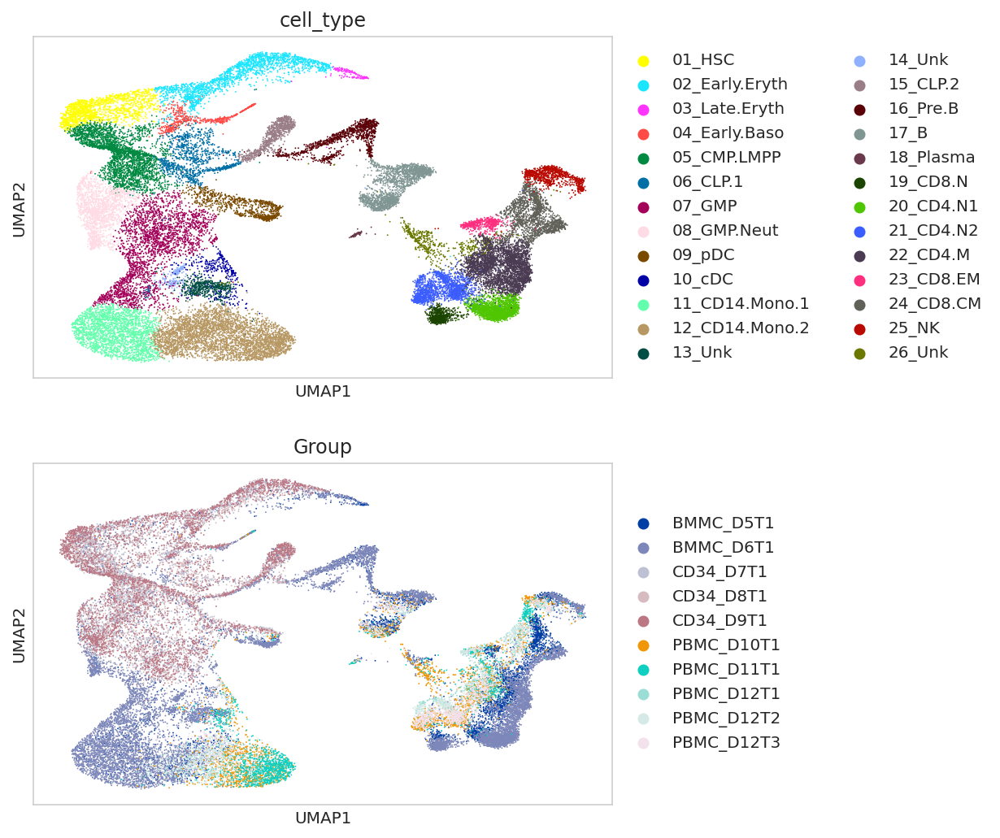

In [47]:
sc.pl.umap(scatac[scatac.obs['condition'] == 'control'], color=['cell_type', 'Group'], ncols=1)

Trying to set attribute `.uns` of view, copying.


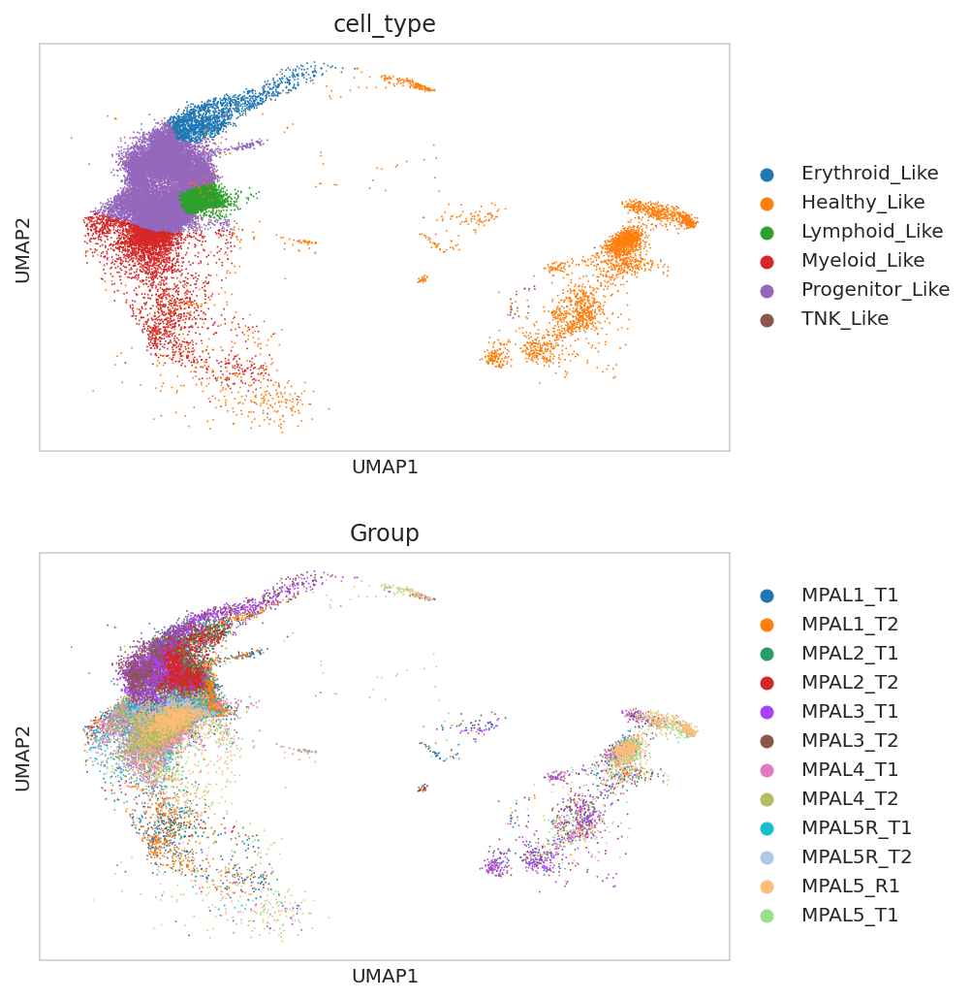

In [48]:
sc.pl.umap(scatac[scatac.obs['condition'] == 'stimulated'], color=['cell_type', 'Group'], ncols=1)

### Running UMAP

In [49]:
sc.pp.neighbors(scatac, random_state=42)
sc.tl.umap(scatac, random_state=42)

         Falling back to preprocessing with `sc.pp.pca` and default params.


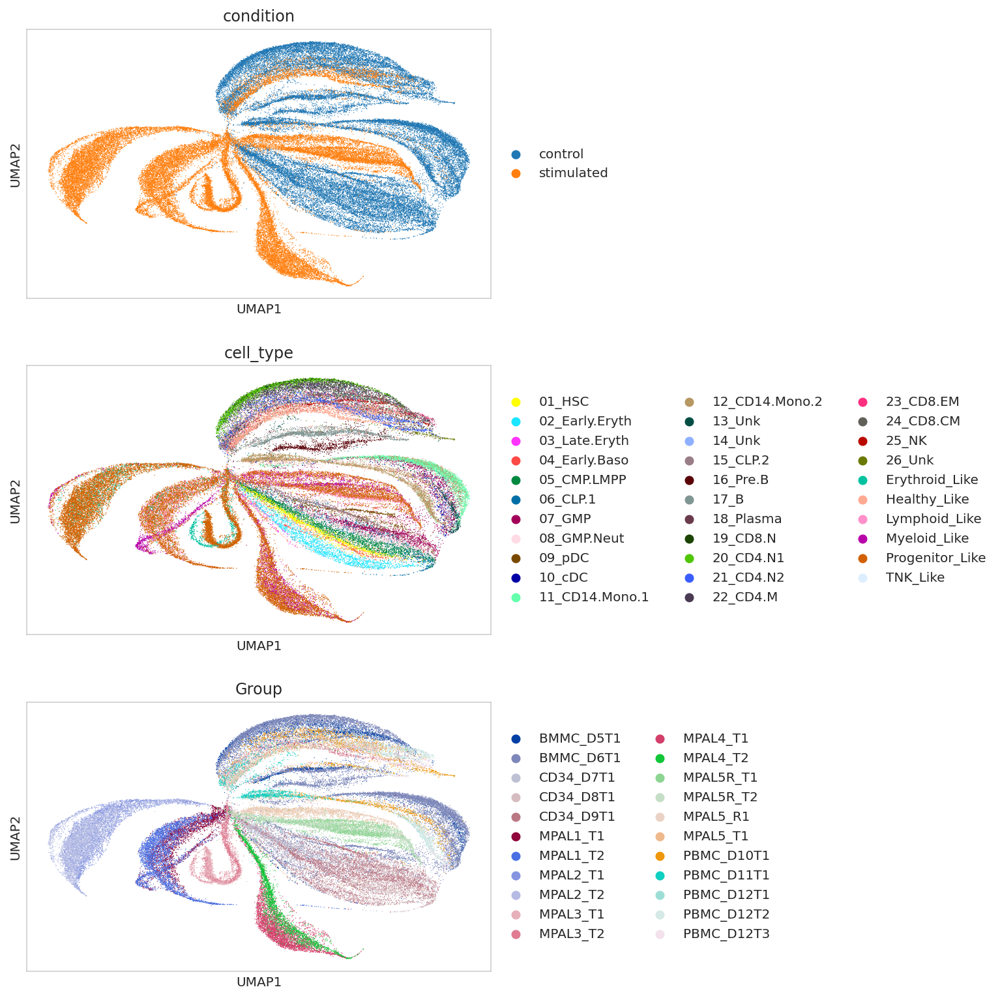

In [50]:
sc.pl.umap(scatac, color=['condition', 'cell_type', 'Group'], ncols=1)

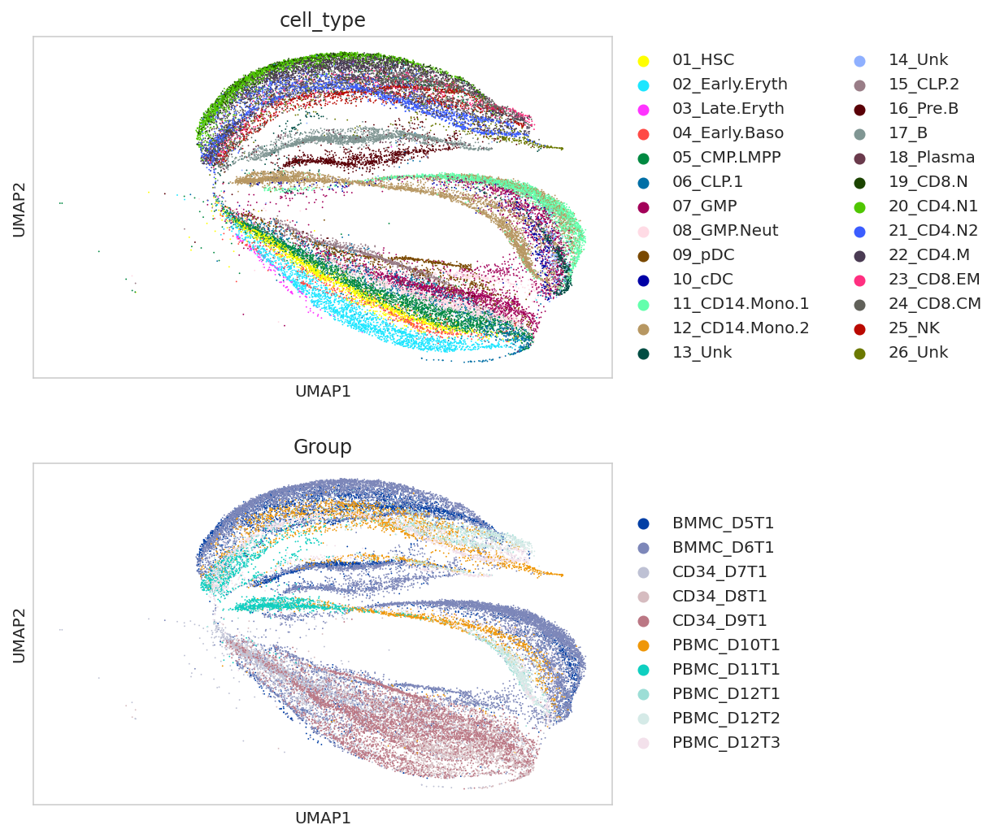

In [51]:
sc.pl.umap(scatac[scatac.obs['condition'] == 'control'], color=['cell_type', 'Group'], ncols=1)

Trying to set attribute `.uns` of view, copying.


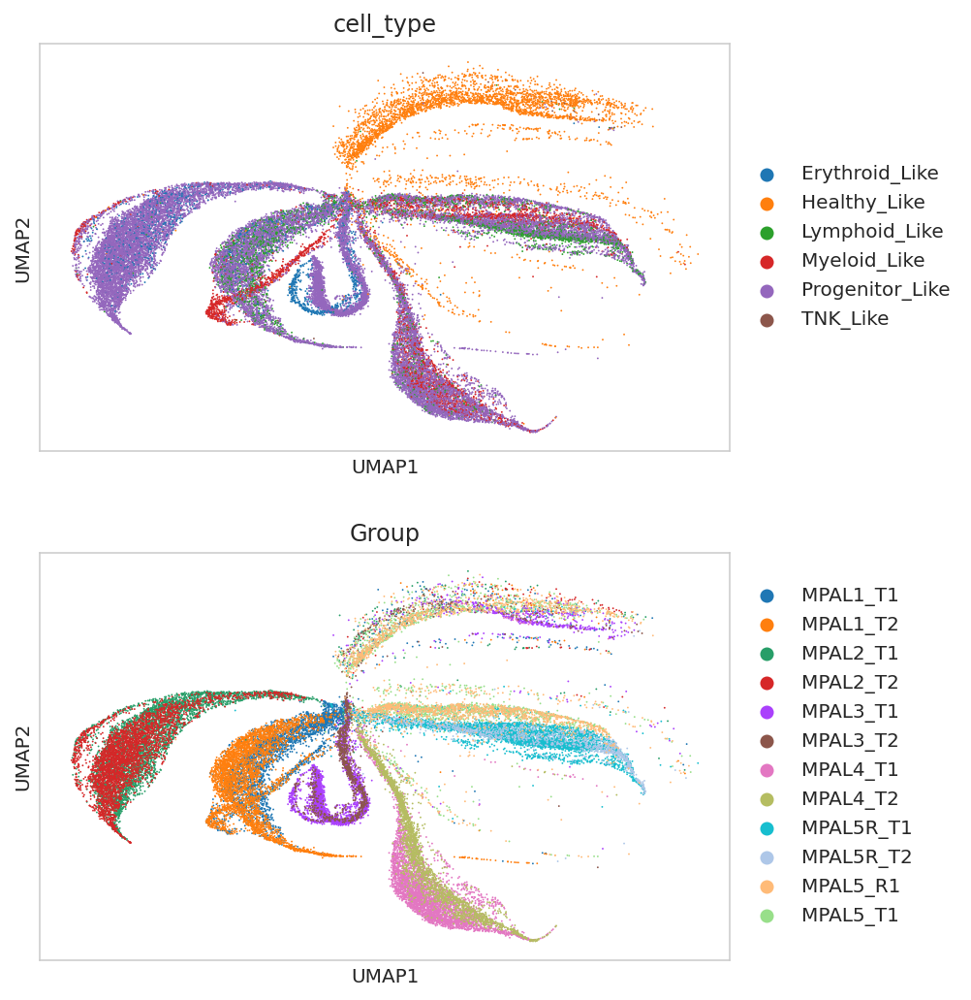

In [52]:
sc.pl.umap(scatac[scatac.obs['condition'] == 'stimulated'], color=['cell_type', 'Group'], ncols=1)

---
# Save the result

## Control Cells

In [53]:
scrna_ctrl = scrna[scrna.obs['condition'] == 'control']
scatac_ctrl = scatac[scatac.obs['condition'] == 'control']
print(scrna_ctrl.shape, scatac_ctrl.shape)

(35582, 2999) (35038, 20002)


In [54]:
n_samples = min(scrna_ctrl.shape[0], scatac_ctrl.shape[0])
scrna_ctrl_sample_indices = np.random.choice(scrna_ctrl.shape[0], size=n_samples, replace=False)
scatac_ctrl_sample_indices = np.random.choice(scatac_ctrl.shape[0], size=n_samples, replace=False)
scrna_ctrl = scrna_ctrl[scrna_ctrl_sample_indices]
scatac_ctrl = scatac_ctrl[scatac_ctrl_sample_indices]
print(scrna_ctrl.shape, scrna_ctrl.shape)

(35038, 2999) (35038, 2999)


In [55]:
%time scrna_ctrl.write(SCRNA_DIR + 'expressions-ctrl.h5ad')

CPU times: user 308 ms, sys: 240 ms, total: 548 ms
Wall time: 7.82 s


In [56]:
%time scatac_ctrl.write_h5ad(SCATAC_DIR + 'peaks-binary-ctrl.h5ad')

CPU times: user 1.04 s, sys: 1.85 s, total: 2.9 s
Wall time: 12.9 s


## All Cells

In [59]:
n_samples = min(scrna.shape[0], scatac.shape[0])
scrna_sample_indices = np.random.choice(scrna.shape[0], size=n_samples, replace=False)
scatac_sample_indices = np.random.choice(scatac.shape[0], size=n_samples, replace=False)
scrna = scrna[scrna_sample_indices]
scatac = scatac[scatac_sample_indices]
print(scrna.shape, scrna.shape)

(53638, 2999) (53638, 2999)


In [60]:
%time scrna.write(SCRNA_DIR + 'expressions.h5ad')

CPU times: user 324 ms, sys: 272 ms, total: 596 ms
Wall time: 1.73 s


In [61]:
%time scatac.write_h5ad(SCATAC_DIR + 'peaks-binary.h5ad')

CPU times: user 1.62 s, sys: 2.76 s, total: 4.38 s
Wall time: 17.2 s
